In [1]:
import pickle
import matplotlib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN, SpectralClustering, MeanShift, estimate_bandwidth
from itertools import cycle
from scipy.cluster.hierarchy import dendrogram, linkage  

%matplotlib inline
%config InlineBackend.figure_format = 'svg'

In [2]:
plt.rc('figure', figsize=(10.0, 5.0))
matplotlib.rcParams.update({'font.size': 22})

# Make numpy outputs easier to read
np.set_printoptions(precision=3, formatter={'float': '{: 8.3f}'.format})

In [3]:
with open('./data/processed/user_ts_X_train.pkl', 'rb') as picklefile:
    X_train = pickle.load(picklefile)

In [5]:
X_train.shape

(126375, 17)

In [6]:
def get_cluster_centers(X, labels, k_num):
    CC_list = []
    for k in range(k_num):
        # get the mean coordinates of each cluster
        CC_list.append(np.mean(X[labels == k], axis = 0))
    return CC_list

# for each cluster substract the mean from each data point to get the error
# then get the magnitude of each error, square it, and sum it
def get_SSE(X, labels):
    k_num = len(np.unique(labels))
    CC_list = get_cluster_centers(X, labels, k_num)
    CSEs = []
    for k in range(k_num):
        # for each cluster of k we get the coordinates of how far off each point is to the cluster
        error_cords = X[labels == k] - CC_list[k]
        # square the coordinates and sum to get the magnitude squared
        error_cords_sq = error_cords ** 2
        error_mag_sq = np.sum(error_cords_sq, axis = 1)
        # since we already have the magnitude of the error squared we can just take the sum for the cluster
        CSE = np.sum(error_mag_sq)
        CSEs.append(CSE)
    # sum each cluster's sum of squared errors
    return sum(CSEs)

In [7]:
def find_elbow(data, low, high, step, title):
    SSEs = []
    X = StandardScaler().fit_transform(data)
    for k in range(low, high, step):
        #print ('clustering trial:', k)
        km = KMeans(n_clusters=k, random_state=4444)
        km.fit(X)
        labels = km.labels_
        #Sil_coefs.append(metrics.silhouette_score(lsa_tfidf_data, labels, metric='euclidean'))
        SSEs.append(get_SSE(X, labels)) # The SSE is just inertia, we could have just said km.inertia_

    k_clusters = range(low, high, step)
    plt.figure(dpi=200)

    # plot Intertia/SSE on ax2
    plt.plot(k_clusters, SSEs)
    plt.xlabel('number of clusters')
    plt.xticks(rotation=90)
    plt.ylabel('SSE')
    plt.xticks(np.arange(low, high, step=step));
    plt.title (title)
    return None

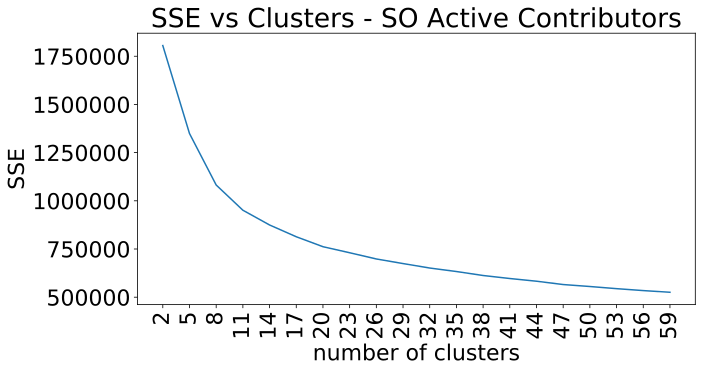

In [10]:
find_elbow(X_train, 2, 60, 3, 'SSE vs Clusters - SO Active Contributors')

### There is no obvious elbow in the plot above, we will choose 15 as the slope slightly smooths after 15
## KMeans

In [63]:
X = StandardScaler().fit_transform(active_contributor_activity.iloc[:,1:])
km = KMeans(n_clusters=15)
ypred = km.fit_predict(X)

In [56]:
X.shape

(23895, 12)

In [58]:
data_tsne = TSNE(n_components=2, verbose=1, perplexity=50).fit_transform(X)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 23895 samples in 0.406s...
[t-SNE] Computed neighbors for 23895 samples in 7.373s...
[t-SNE] Computed conditional probabilities for sample 1000 / 23895
[t-SNE] Computed conditional probabilities for sample 2000 / 23895
[t-SNE] Computed conditional probabilities for sample 3000 / 23895
[t-SNE] Computed conditional probabilities for sample 4000 / 23895
[t-SNE] Computed conditional probabilities for sample 5000 / 23895
[t-SNE] Computed conditional probabilities for sample 6000 / 23895
[t-SNE] Computed conditional probabilities for sample 7000 / 23895
[t-SNE] Computed conditional probabilities for sample 8000 / 23895
[t-SNE] Computed conditional probabilities for sample 9000 / 23895
[t-SNE] Computed conditional probabilities for sample 10000 / 23895
[t-SNE] Computed conditional probabilities for sample 11000 / 23895
[t-SNE] Computed conditional probabilities for sample 12000 / 23895
[t-SNE] Computed conditional probabilities for sa

In [59]:
with open('./data/processed/data_tsne.pkl', 'wb') as picklefile:
    pickle.dump(data_tsne, picklefile)

In [60]:
with open('./data/processed/data_tsne.pkl', 'rb') as picklefile:
    data_tsne = pickle.load(picklefile)

In [61]:
plt.figure(dpi=250)
plt.title("TSNE FOR K-Means Clustering of Active Contributors")
sns.scatterplot(data_tsne[:, 0], data_tsne[:, 1], ypred,
               size = 2, palette = 'rainbow', alpha = 0.2,
              markers = '.', legend="full");

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig('./data/img/TNSE_Kmeans_AC.png')

In [112]:
individual_sum = active_contributor_activity.iloc[:,1:].sum(axis=1)

In [116]:
ac_act_normalized = active_contributor_activity.iloc[:,1:].as_matrix()/individual_sum[:,np.newaxis]

/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """Entry point for launching an IPython kernel.


In [120]:
ac_act_normalized_pd = pd.DataFrame(ac_act_normalized, columns=active_contributor_activity.columns[1:]) 

In [121]:
ac_act_normalized_pd.head()

,m_201701,m_201702,m_201703,m_201704,m_201705,m_201706,m_201707,m_201708,m_201709,m_201710,m_201711,m_201712
0,0.000000,0.000000,0.000000,0.000000,0.975000,0.0,0.000000,0.025000,0.000000,0.000000,0.0,0.000000
1,0.142857,0.142857,0.047619,0.142857,0.095238,0.0,0.142857,0.000000,0.047619,0.095238,0.0,0.142857
2,0.000000,0.111111,0.000000,0.833333,0.055556,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
3,0.000000,0.000000,0.000000,0.136364,0.000000,0.0,0.000000,0.181818,0.272727,0.318182,0.0,0.090909
4,0.300000,0.000000,0.000000,0.100000,0.000000,0.0,0.000000,0.200000,0.100000,0.000000,0.2,0.100000


## DBScan

In [ ]:
db = DBSCAN(eps=0.15, min_samples=3).fit(X)

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

unique_labels = set(labels)
colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_labels)))
plt.figure(dpi=200)
show_core = True
show_non_core = True
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = 'k'

    class_member_mask = (labels == k)
    if show_core:
        xy = X[class_member_mask & core_samples_mask]
        x, y = xy[:,0], xy[:,1]
        plt.scatter(x, y, c=col, edgecolors='k',  s=20, linewidths=1.1)
    
    if show_non_core:
        xy = X[class_member_mask & ~core_samples_mask]
        x, y = xy[:,0], xy[:,1]
        plt.scatter(x, y, c=col, s=20, linewidths=1.1)

plt.title('Estimated number of clusters: %d' % n_clusters_);

In [ ]:
plt.figure(dpi=250)
plt.title("TSNE FOR DBSCAN - LSA TFIDF DATA")
sns.scatterplot(data_tsne[:, 0], data_tsne[:, 1], labels,
               size = 2, palette = 'rainbow', alpha = 'auto',
              markers = '.', legend="full");

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);

## Mean-Shift

In [84]:
# The following bandwidth can be automatically detected using
bandwidth = estimate_bandwidth(X, quantile=0.2, n_samples=500)

ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms.fit(X)
labels = ms.labels_
cluster_centers = ms.cluster_centers_

labels_unique = np.unique(labels)
n_clusters_ = len(labels_unique)

print("number of estimated clusters : %d" % n_clusters_)

number of estimated clusters : 774


In [ ]:
plt.figure(1)
plt.clf()
plt.figure(dpi=200)
colors = cycle('byrcmykbgrcmykbgrcmykbgrcmyk')
for k, col in zip(range(n_clusters_), colors):
    my_members = labels == k
    cluster_center = cluster_centers[k]
    plt.plot(X[my_members, 0], X[my_members, 1], col + '.')
    plt.plot(cluster_center[0], cluster_center[1], 'X', markerfacecolor='k',
             markeredgecolor='k', markersize=14)
plt.title('Estimated number of clusters: %d' % n_clusters_);

## Dendrogram

In [89]:
linked = linkage(X, 'ward')